In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import math
import re

from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer, WordNetLemmatizer
import nltk

In [2]:
# Download necessary NLTK data
nltk.download('wordnet')
nltk.download('omw-1.4')  # If using a newer version of NLTK
nltk.download('punkt')  # For tokenization
nltk.download('stopwords')  # For stopwords

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [3]:
# Initialize stopwords, stemmer, and lemmatizer
stop_words = set(stopwords.words('english'))
stemmer = SnowballStemmer('english')
lemmatizer = WordNetLemmatizer()

In [4]:
df = pd.read_csv("/content/combined_data.csv")
df.head()

,label,text
0,1,ounce feather bowl hummingbird opec moment ala...
1,1,wulvob get your medircations online qnb ikud v...
2,0,computer connection from cnn com wednesday es...
3,1,university degree obtain a prosperous future m...
4,0,thanks for all your answers guys i know i shou...


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83448 entries, 0 to 83447
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   label   83448 non-null  int64 
 1   text    83448 non-null  object
dtypes: int64(1), object(1)
memory usage: 1.3+ MB


In [6]:
label_counts = df['label'].value_counts()
labels = ['spam', 'ham']

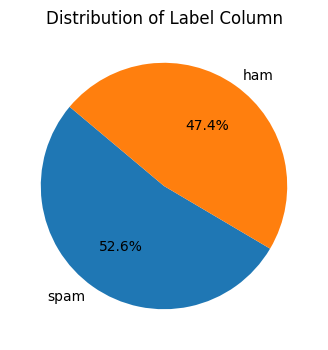

In [7]:
# Plot the distribution of the 'label' column
plt.figure(figsize=(4, 4))
plt.pie(label_counts, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Label Column')
plt.show()

In [8]:
# Function to preprocess text data
def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove non-alphabetic characters
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Tokenize the text
    words = text.split()
    # Remove stopwords
    words = [word for word in words if word not in stop_words]
    # Stemming
    words = [stemmer.stem(word) for word in words]
    # Lemmatization
    words = [lemmatizer.lemmatize(word) for word in words]
    return words

In [9]:
# Apply preprocessing to the 'text' column
df['text'] = df['text'].apply(preprocess_text)

In [10]:
df.head()

,label,text
0,1,"[ounc, feather, bowl, hummingbird, opec, momen..."
1,1,"[wulvob, get, medirc, onlin, qnb, ikud, viagra..."
2,0,"[comput, connect, cnn, com, wednesday, escapen..."
3,1,"[univers, degre, obtain, prosper, futur, money..."
4,0,"[thank, answer, guy, know, check, rsync, manua..."


In [11]:
# Create a dictionary of words
word_dict = {}

def build_dictionary(text):
    for sublist in text:
        for word in sublist:
            if word not in word_dict:
                word_dict[word] = len(word_dict)

In [12]:
build_dictionary(df['text'])

In [14]:
from collections import Counter
# Count the frequency of each word
word_counter = Counter()
for sublist in df['text']:
    word_counter.update(sublist)

In [15]:
word_counter.most_common(10)

[('escapenumb', 1141590),
 ('escapelong', 227221),
 ('http', 91458),
 ('com', 69835),
 ('r', 60751),
 ('enron', 52872),
 ('c', 51972),
 ('use', 46970),
 ('org', 43599),
 ('plea', 40727)]

In [16]:
# Count total words
total_words = sum(word_counter.values())
total_words

14236264

In [17]:
# Count the frequency of each unique word
word_probabilities = {word: count / total_words for word, count in word_counter.items()}

In [18]:
# Define a threshold for common words
threshold = 0.001

# Filter words based on the threshold
most_common_words = [word for word, prob in word_probabilities.items() if prob > threshold]
most_common_words.sort()
print("Most common words:", most_common_words)
print("Number of most common words:", len(most_common_words))

Most common words: ['also', 'b', 'branch', 'busi', 'c', 'call', 'ch', 'chang', 'code', 'com', 'comment', 'compani', 'contain', 'could', 'custom', 'data', 'day', 'de', 'e', 'ect', 'email', 'energi', 'enron', 'escapelong', 'escapenumb', 'escapenumberd', 'escapenumbermg', 'ethz', 'file', 'first', 'follow', 'free', 'get', 'go', 'guid', 'h', 'help', 'hou', 'html', 'http', 'includ', 'inform', 'item', 'know', 'like', 'line', 'list', 'look', 'mail', 'mailman', 'make', 'manag', 'market', 'may', 'messag', 'n', 'name', 'need', 'new', 'news', 'number', 'offer', 'one', 'org', 'p', 'peopl', 'per', 'pill', 'plea', 'pm', 'post', 'power', 'price', 'product', 'project', 'provid', 'r', 'read', 'receiv', 'report', 'return', 'right', 'said', 'samba', 'save', 'say', 'secur', 'see', 'self', 'servic', 'set', 'sourc', 'stat', 'state', 'subject', 'system', 'take', 'test', 'thank', 'time', 'tri', 'u', 'use', 'want', 'watch', 'way', 'week', 'work', 'would', 'www', 'x', 'year']
Number of most common words: 112


In [19]:
count_label_1 = df.loc[df['label'] == 1].shape[0]
count_label_0 = df.loc[df['label'] == 0].shape[0]
total_labels = df.shape[0]

In [20]:
# Calculate prior probabilities for spam and ham
prior_spam = count_label_1 / total_labels
prior_ham = count_label_0 / total_labels

print(prior_spam)
print(prior_ham)

0.5261959543667913
0.4738040456332087


In [21]:
# Separate spam and ham messages
df_spam = df.loc[df['label'] == 1, 'text']
df_ham = df.loc[df['label'] == 0, 'text']

In [22]:
# Function to calculate conditional probabilities
def calculate_conditional_probabilities(text):
    word_dict_spam = {}
    word_dict_ham = {}

    # Count words in spam messages
    for message in df_spam:
        for word in message:
            if word in word_dict_spam:
                word_dict_spam[word] += 1
            else:
                word_dict_spam[word] = 1

    # Count words in ham messages
    for message in df_ham:
        for word in message:
            if word in word_dict_ham:
                word_dict_ham[word] += 1
            else:
                word_dict_ham[word] = 1

    return word_dict_spam, word_dict_ham

In [23]:
word_dict_spam, word_dict_ham = calculate_conditional_probabilities(df)

In [24]:
# Calculate total words in spam and ham messages
total_spam_words = sum(word_dict_spam.values())
total_ham_words = sum(word_dict_ham.values())
vocabulary = set(list(word_dict_spam.keys()) + list(word_dict_ham.keys()))

In [25]:
# Calculate conditional probabilities with Laplace smoothing
def calculate_conditional_probabilities_with_smoothing(word_dict_spam, word_dict_ham, total_spam_words, total_ham_words, vocabulary, lambda_smoothing=1):
    conditional_prob_spam = {}
    conditional_prob_ham = {}

    for word in vocabulary:
        count_spam = word_dict_spam.get(word, 0)
        count_ham = word_dict_ham.get(word, 0)

        # Calculate conditional probabilities with Laplace smoothing
        conditional_prob_spam[word] = (count_spam + lambda_smoothing) / (total_spam_words + lambda_smoothing * len(vocabulary))
        conditional_prob_ham[word] = (count_ham + lambda_smoothing) / (total_ham_words + lambda_smoothing * len(vocabulary))

    return conditional_prob_spam, conditional_prob_ham

In [26]:
conditional_prob_spam, conditional_prob_ham = calculate_conditional_probabilities_with_smoothing(
    word_dict_spam, word_dict_ham, total_spam_words, total_ham_words, vocabulary
)

print("Conditional Probabilities for Spam:", conditional_prob_spam)
print("Conditional Probabilities for Ham:", conditional_prob_ham)

Conditional Probabilities for Spam: {'escapenumberebh': 3.566197723553345e-07, 'wcmv': 3.566197723553345e-07, 'dbe': 7.13239544710669e-07, 'meeeeeeed': 3.566197723553345e-07, 'herford': 3.566197723553345e-07, 'pppppppppppppppp': 3.566197723553345e-07, 'optik': 3.566197723553345e-07, 'rcach': 1.7830988617766725e-07, 'dataplot': 1.7830988617766725e-07, 'newsno': 1.7830988617766725e-07, 'producc': 3.566197723553345e-07, 'eruditelyworldwid': 3.566197723553345e-07, 'ekiga': 1.7830988617766725e-07, 'timeros': 1.7830988617766726e-06, 'qescapenumberyd': 1.9614087479543398e-06, 'isolinux': 1.7830988617766725e-07, 'normwt': 1.7830988617766725e-07, 'saddl': 5.527606471507685e-06, 'furti': 1.7830988617766725e-07, 'exescapenumberlo': 3.566197723553345e-07, 'eyeswher': 5.349296585330018e-07, 'comegiven': 3.566197723553345e-07, 'sashok': 8.915494308883363e-06, 'overdos': 8.915494308883363e-07, 'testa': 1.0698593170660036e-06, 'laxtwg': 3.566197723553345e-07, 'presitgi': 3.566197723553345e-07, 'testen

In [27]:
# Function to classify a message using Naive Bayes
def classify_message(message, conditional_prob_spam, conditional_prob_ham, prior_spam, prior_ham):
    spam_probability = math.log(prior_spam)
    ham_probability = math.log(prior_ham)

    for word in message:
        if word in conditional_prob_spam:
            spam_probability += math.log(conditional_prob_spam[word])
        if word in conditional_prob_ham:
            ham_probability += math.log(conditional_prob_ham[word])

    if spam_probability > ham_probability:
        return 1
    else:
        return 0

In [28]:
# Apply classification to the dataset
predictions = df['text'].apply(lambda x: classify_message(x, conditional_prob_spam, conditional_prob_ham, prior_spam, prior_ham))

In [29]:
# Evaluate the model
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

correct_predictions = df['label']

confusion = confusion_matrix(correct_predictions, predictions)
accuracy = accuracy_score(correct_predictions, predictions)
precision = precision_score(correct_predictions, predictions)
recall = recall_score(correct_predictions, predictions)
f1 = f1_score(correct_predictions, predictions)

print(f"Accuracy:, {accuracy:.3f}")
print("Confusion Matrix:\n", confusion)
print(f"Precision:, {precision:.3f}")
print(f"Recall:, {recall:.3f}")
print(f"F1 Score:, {f1:.3f}")

Accuracy:, 0.980
Confusion Matrix:
 [[38980   558]
 [ 1134 42776]]
Precision:, 0.987
Recall:, 0.974
F1 Score:, 0.981
